In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import plotly
from IPython.display import display, HTML
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display, HTML
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve , auc

import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

## Tomas Mazak's workaround
plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

In [2]:
import pandas as pd

# Path to the manoeuvre file
file_path = "../satellite_data/manoeuvres/ja1man.txt"

one_burn_max_length = 276
file_contents = []
with open(file_path, "r") as file:
    for line in file:
        file_contents.append(line[:one_burn_max_length])


base_cols = [
    "satellite",
    "start_year", "start_doy", "start_hour", "start_minute",
    "end_year", "end_doy", "end_hour", "end_minute",
    # "maneuver_type", 
    "param_type",             # 005, 006, 007
    "num_burns"
]

# Fields that repeat once for each burn (we’ll handle just the first burn here)
burn_cols = [
    "burn_year", "burn_doy", "burn_hour", "burn_minute", "burn_second",
    "boost_duration_sec",
    "dv1_mps", "dv2_mps", "dv3_mps",
    "acc1_µmps²", "acc2_µmps²", "acc3_µmps²",
    "delta_acc1_µmps²", "delta_acc2_µmps²", "delta_acc3_µmps²"
]

cols = base_cols + burn_cols   # total = 27 columns for a single-burn record

df = pd.DataFrame([line.split() for line in file_contents], columns=cols)
# remove NA values
df = df.dropna()
# Convert all columns to float except the satellite column
df[df.columns[1:]] = df[df.columns[1:]].astype(float)

date_cols = ['start_year', 'start_doy', 'start_hour', 'start_minute',
             'end_year', 'end_doy', 'end_hour', 'end_minute',
             'burn_year', 'burn_doy', 'burn_hour', 'burn_minute', 'burn_second']
additional_int_cols = ["param_type", "num_burns"]

df[date_cols + additional_int_cols] = df[date_cols + additional_int_cols].astype(int)

# Merge the date columns into a single datetime column
start_cols = ['start_year', 'start_doy', 'start_hour', 'start_minute']
end_cols = ['end_year', 'end_doy', 'end_hour', 'end_minute']
burn_cols = ['burn_year', 'burn_doy', 'burn_hour', 'burn_minute', 'burn_second']

df['start_timestamp'] = df[start_cols].apply(lambda x: f"{x['start_year']}-{x['start_doy']}-{x['start_hour']}:{x['start_minute']}:00", axis=1)
df['end_timestamp'] = df[end_cols].apply(lambda x: f"{x['end_year']}-{x['end_doy']}-{x['end_hour']}:{x['end_minute']}:00", axis=1)
df['burn_timestamp'] = df[burn_cols].apply(lambda x: f"{x['burn_year']}-{x['burn_doy']}-{x['burn_hour']}:{x['burn_minute']}:{x['burn_second']}", axis=1)
df['start_timestamp'] = pd.to_datetime(df['start_timestamp'], format='%Y-%j-%H:%M:%S')
df['end_timestamp'] = pd.to_datetime(df['end_timestamp'], format='%Y-%j-%H:%M:%S')
df['burn_timestamp'] = pd.to_datetime(df['burn_timestamp'], format='%Y-%j-%H:%M:%S')
df.drop(columns=date_cols, inplace=True)

df.tail(5)


,satellite,param_type,num_burns,boost_duration_sec,dv1_mps,dv2_mps,dv3_mps,acc1_µmps²,acc2_µmps²,acc3_µmps²,delta_acc1_µmps²,delta_acc2_µmps²,delta_acc3_µmps²,start_timestamp,end_timestamp,burn_timestamp
114,JASO1,7,1,5.875,0.0,0.00716,0.0,0.0,1218.723404,0.0,0.0,0.0,0.0,2012-10-02 23:57:00,2012-10-02 23:58:00,2012-10-02 23:57:29
115,JASO1,7,1,4.500,0.0,0.00509,0.0,0.0,1131.111111,0.0,0.0,0.0,0.0,2012-11-26 00:14:00,2012-11-26 00:15:00,2012-11-26 00:15:08
116,JASO1,7,1,4.625,0.0,0.00590,0.0,0.0,1275.675676,0.0,0.0,0.0,0.0,2013-02-13 21:53:00,2013-02-13 21:53:00,2013-02-13 21:53:13
117,JASO1,7,1,3.125,0.0,0.00356,0.0,0.0,1139.200000,0.0,0.0,0.0,0.0,2013-04-03 22:34:00,2013-04-03 22:35:00,2013-04-03 22:34:34
118,JASO1,7,1,5.250,0.0,0.00604,0.0,0.0,1150.476190,0.0,0.0,0.0,0.0,2013-06-13 22:32:00,2013-06-13 22:33:00,2013-06-13 22:33:08


In [3]:
# Oribital data
orbital_file = "../satellite_data/orbital_elements/Jason-1.csv"

orbital_df = pd.read_csv(orbital_file)
orbital_df.columns = ["timestamp"] + orbital_df.columns[1:].tolist()
orbital_df["timestamp"] = pd.to_datetime(orbital_df["timestamp"], format="%Y-%m-%d %H:%M:%S.%f")
orbital_df.head(5)

,timestamp,eccentricity,argument of perigee,inclination,mean anomaly,Brouwer mean motion,right ascension
0,2001-12-22 04:13:05.190527,0.000851,4.661221,1.152701,-4.846921,0.055877,6.092690
1,2001-12-23 23:23:38.458751,0.000839,4.615654,1.152689,-4.615556,0.055877,6.027578
2,2001-12-24 23:45:59.288255,0.000836,4.609627,1.152690,-4.609521,0.055878,5.990822
3,2001-12-25 22:15:50.795999,0.000830,4.597215,1.152689,-4.597084,0.055878,5.956886
4,2001-12-26 11:23:15.892799,0.000822,4.593359,1.152684,-4.593216,0.055878,5.937093


# EDA

Median time gap (days): 1.014987189988426
Max time gap (days): 4.528344809988426


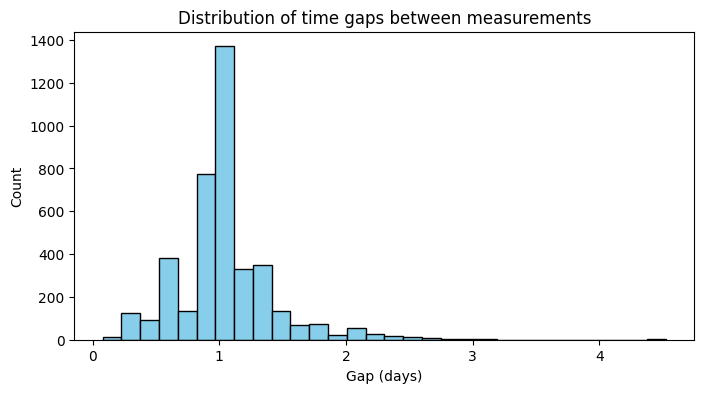

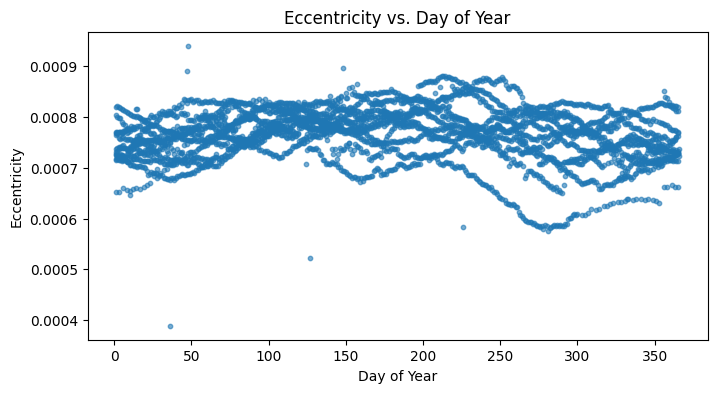

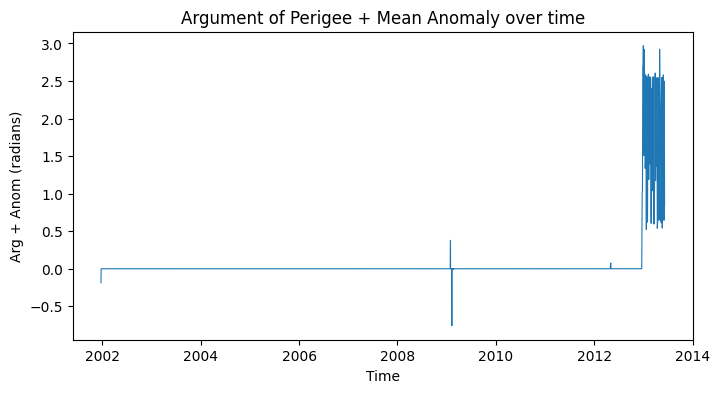

Mean of arg+anom: 0.032661070455708124
Std dev of arg+anom: 0.26211476151966157


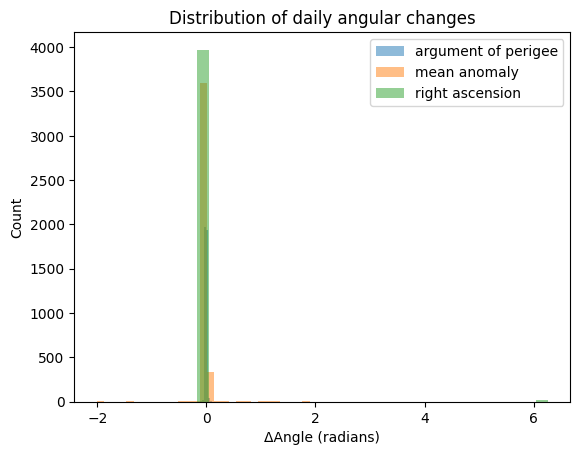

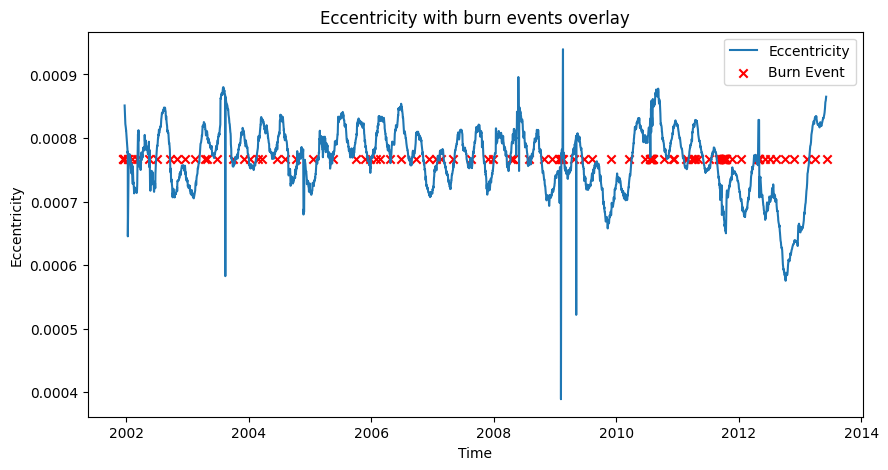

In [4]:
# Load Data
burn_df = df

# Sort by time
orbital_df = orbital_df.sort_values('timestamp').reset_index(drop=True)

# Temporal resolution & data gaps-
orbital_df['time_diff_days'] = orbital_df['timestamp'].diff().dt.total_seconds() / 86400
print("Median time gap (days):", orbital_df['time_diff_days'].median())
print("Max time gap (days):", orbital_df['time_diff_days'].max())

plt.figure(figsize=(8,4))
plt.hist(orbital_df['time_diff_days'].dropna(), bins=30, color='skyblue', edgecolor='k')
plt.title("Distribution of time gaps between measurements")
plt.xlabel("Gap (days)")
plt.ylabel("Count")
plt.show()

# Annual seasonality in eccentricity

orbital_df['day_of_year'] = orbital_df['timestamp'].dt.dayofyear
plt.figure(figsize=(8,4))
plt.scatter(orbital_df['day_of_year'], orbital_df['eccentricity'], s=10, alpha=0.6)
plt.title("Eccentricity vs. Day of Year")
plt.xlabel("Day of Year")
plt.ylabel("Eccentricity")
plt.show()

# Argument + Mean anomaly conservation

orbital_df['arg_plus_anom'] = orbital_df['argument of perigee'] + orbital_df['mean anomaly']
plt.figure(figsize=(8,4))
plt.plot(orbital_df['timestamp'], orbital_df['arg_plus_anom'], lw=0.8)
plt.title("Argument of Perigee + Mean Anomaly over time")
plt.xlabel("Time")
plt.ylabel("Arg + Anom (radians)")
plt.show()

print("Mean of arg+anom:", orbital_df['arg_plus_anom'].mean())
print("Std dev of arg+anom:", orbital_df['arg_plus_anom'].std())

# Angular daily change distribution

for col in ['argument of perigee', 'mean anomaly', 'right ascension']:
    diff = orbital_df[col] - orbital_df[col].shift(1)
    plt.hist(diff.dropna(), bins=30, alpha=0.5, label=col)

plt.title("Distribution of daily angular changes")
plt.xlabel("ΔAngle (radians)")
plt.ylabel("Count")
plt.legend()
plt.show()

# Burn timestamps overlay on eccentricity

burn_days = burn_df['burn_timestamp'].dt.normalize()
plt.figure(figsize=(10,5))
plt.plot(orbital_df['timestamp'], orbital_df['eccentricity'], label='Eccentricity')
plt.scatter(burn_days, 
            [orbital_df['eccentricity'].mean()]*len(burn_days),
            color='red', marker='x', label='Burn Event')
plt.title("Eccentricity with burn events overlay")
plt.xlabel("Time")
plt.ylabel("Eccentricity")
plt.legend()
plt.show()



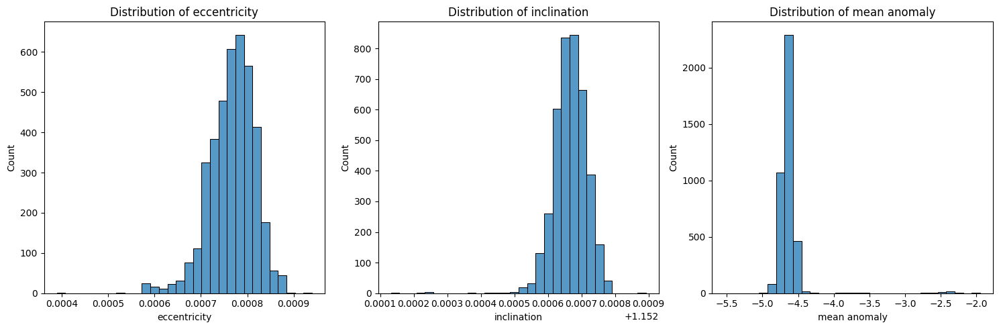

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create histograms for columns
plt.figure(figsize=(15, 5))

# Plot histogram for acc1
plt.subplot(1, 3, 1)
sns.histplot(data=orbital_df, x='eccentricity', bins=30)
plt.title('Distribution of eccentricity')
plt.xlabel('eccentricity')

# Plot histogram for acc2 
plt.subplot(1, 3, 2)
sns.histplot(data=orbital_df, x='inclination', bins=30)
plt.title('Distribution of inclination')
plt.xlabel('inclination')

# Plot histogram for acc3
plt.subplot(1, 3, 3)
sns.histplot(data=orbital_df, x='mean anomaly', bins=30)
plt.title('Distribution of mean anomaly')
plt.xlabel('mean anomaly')

plt.tight_layout()
plt.show()


In [6]:
# Plotting along the burns
burn_times = pd.to_datetime(df["burn_timestamp"])  # Series/array of datetimes

features_to_plot = orbital_df.columns[1:].tolist()

figures = []

for feature in tqdm(features_to_plot):
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=orbital_df["timestamp"],
        y = orbital_df[feature],
        mode="lines",
        name=feature,
    ))
    
    # Add vertical lines for burn times
    for bt in burn_times:
        fig.add_vline(x=bt, line_dash="dash", line_color="red", line_width=1)
    
    # Cosmetics
    fig.update_yaxes(title_text=feature)
    fig.update_layout(
        height=500,
        showlegend=False,
        margin=dict(t=40, b=40, l=60, r=20),
    )
    fig.update_xaxes(linecolor='black', linewidth=2, mirror=True)
    fig.update_yaxes(linecolor='black', linewidth=2, mirror=True)
    
    figures.append(fig)

# Show figures
for fig in figures:
    fig.show()

100%|██████████| 9/9 [00:26<00:00,  2.96s/it]


In [7]:
feature_selected = "Brouwer mean motion"

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=orbital_df["timestamp"],
    y=orbital_df[feature_selected],
    mode="lines",
    name=feature_selected,
))

# Add vertical lines for burn times
for bt in burn_times:
    fig.add_vline(x=bt, line_dash="dash", line_color="red", line_width=1)

# Cosmetics
fig.update_yaxes(title_text=feature_selected)
fig.update_layout(
    height=500,
    showlegend=False,
    margin=dict(t=40, b=40, l=60, r=20),
)
fig.update_xaxes(linecolor='black', linewidth=2, mirror=True)
fig.update_yaxes(linecolor='black', linewidth=2, mirror=True)

fig.show()


## Forecasting

* Model Loading and prediction
* Data is Standard Scaled using the data from the selected feature and inverse is calculated using the same $\mu$ & $\sigma$

In [8]:
import xgboost as xgb
import joblib

model = xgb.XGBRegressor()
model.load_model("./test_regr_jason1_brouwermeanmotion.json")
window_size = 10

x_scaler = joblib.load("./x_scaler_brouwermeanmotion.joblib")
y_scaler = joblib.load("./y_scaler_brouwermeanmotion.joblib")

# Run prediction with XGBoost on the selected feature
start_idx = window_size
end_idx = len(orbital_df) - 11


predictions = []
for i in range(start_idx, end_idx):
    X = orbital_df[feature_selected].iloc[i-window_size:i].values
    X_scaled = x_scaler.transform(X.reshape(1, -1))
    prediction = model.predict(X_scaled)
    predictions.append(y_scaler.inverse_transform(prediction.reshape(-1, 1)).ravel()[0])

print(predictions)

[np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05588061), np.float32(0.05589737), np.float32(0.055906903), np.float32(0.05590727), np.float32(0.055907022), np.float32(0.055906635), np.float32(0.05590717), np.float32(0.055906836), np.float32(0.05590662), np.float32(0.055906873), np.float32(0.055906888), np.float32(0.055906918), np.float32(0.05590684), np.float32(0.055906847), np.float32(0.055906847), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906843), np.float32(0.055906847), np.float32(0.05590679), np.float32(0.055906806), np.float32(0.055

In [9]:
feature_selected = "Brouwer mean motion"

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=orbital_df["timestamp"],
    y=orbital_df[feature_selected],
    mode="lines",
    name=feature_selected,
))

fig.add_trace(go.Scatter(
    x=orbital_df["timestamp"][window_size:],
    y=predictions,
    mode="lines",
    name="Predicted",
))

# Add vertical lines for burn times
for bt in burn_times:
    fig.add_vline(x=bt, line_dash="dash", line_color="red", line_width=1)

# Cosmetics
fig.update_yaxes(title_text=feature_selected)
fig.update_layout(
    height=500,
    margin=dict(t=40, b=40, l=60, r=20),
)
fig.update_xaxes(linecolor='black', linewidth=2, mirror=True)
fig.update_yaxes(linecolor='black', linewidth=2, mirror=True)

fig.show()

#### Converting residuals to anomalies

$ anomalies_{pred} = pos(residuals > \theta) $

$ \theta = \mu + x * \sigma; x \in (0, 0.25, 0.5, 0.75, 1, 2, 2.5, 3) $

In [10]:
residuals = orbital_df[feature_selected].to_numpy()[start_idx:end_idx] - predictions
residuals = np.abs(residuals)

thres = np.mean(residuals) + 0.5 * np.std(residuals)
anomalies = residuals > thres

anomalies_timestamp = orbital_df["timestamp"][start_idx:end_idx][anomalies]

feature_selected = "Brouwer mean motion"
fig = go.Figure()
# Observed data
fig.add_trace(go.Scatter(
    x=orbital_df["timestamp"][start_idx:end_idx],
    y=orbital_df[feature_selected],
    mode="lines",
    name="Observed Data",
))
# Prediction
fig.add_trace(go.Scatter(
    x=orbital_df["timestamp"][start_idx:end_idx],
    y=predictions,
    mode="lines",
    name="Prediction",
    marker=dict(color="orange", size=8),
))
# Anomalies
fig.add_trace(go.Scatter(
    x=anomalies_timestamp,
    y=orbital_df[orbital_df["timestamp"].isin(anomalies_timestamp)][feature_selected],
    mode="markers",
    name="Anomalies",
    marker=dict(color="red", size=8, symbol="triangle-up"),
))

# Burn times
fig.add_vline(x=burn_times[0], line_dash="dash", line_color="green", line_width=1, name="Ground Truth Manoeuvre", showlegend=True)
for bt in burn_times[1:]:
    fig.add_vline(x=bt, line_dash="dash", line_color="green", line_width=1, showlegend=False)


# Cosmetics
fig.update_yaxes(title_text=feature_selected)
fig.update_layout(
    height=500,
    margin=dict(t=40, b=40, l=60, r=20),
)
fig.update_xaxes(linecolor='black', linewidth=2, mirror=True, title_text="Time")
fig.update_yaxes(linecolor='black', linewidth=2, mirror=True)
fig.update_layout(template="seaborn", title="Brouwer Mean Motion - anomaly detection")
fig.show()

In [11]:
# Residual plot
residuals = orbital_df[feature_selected].to_numpy()[start_idx:end_idx] - predictions
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=orbital_df["timestamp"][start_idx:end_idx],
    y=residuals,
    mode="lines",
    name="Residuals",
))
# Anomalies
fig.add_trace(go.Scatter(
    x=anomalies_timestamp,
    y=residuals[anomalies],
    mode="markers",
    name="Anomalies",
    marker=dict(color="red", size=8, symbol="triangle-up"),
))

# Burn times
fig.add_vline(x=burn_times[0], line_dash="dash", line_color="green", line_width=1, name="Burn Times", showlegend=True)
for bt in burn_times[1:]:
    fig.add_vline(x=bt, line_dash="dash", line_color="green", line_width=1, showlegend=False)

# Add horizontal line for threshold
fig.add_hline(y=thres, line_dash="dash", line_color="red", line_width=1, name="Threshold", showlegend=False)
fig.add_hline(y=-thres, line_dash="dash", line_color="red", line_width=1, name="Threshold", showlegend=False)

# Cosmetics
fig.update_layout(template="seaborn", title="Brouwer Mean Motion | Residuals + Anomalies", height=500)
fig.update_xaxes(linecolor='black', linewidth=1, mirror=True, title="Time")
fig.update_yaxes(linecolor='black', linewidth=1, mirror=True, title="Residuals")

fig.show()

### Anomalies to Classification
* $ y_{true} $ are the days where the burn has occured.
* Ground truth are selected as days because the the orbital data is sampled at a daily interval.
* $ y_{pred} $ are the days corresponding to the $anomalies_{pred}$

In [12]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import precision_recall_curve, roc_curve
import plotly.graph_objs as go

# Generate y_true as the day in which the burn occurs, all the other days are 0
burn_days = df["burn_timestamp"].dt.normalize()
orbital_days = orbital_df["timestamp"].dt.normalize()
mask = orbital_days.isin(burn_days)

y_true = np.zeros(len(orbital_df["timestamp"]))
y_true[mask] = 1


def get_anomalies(residuals, thres):
    anomalies = residuals > thres
    return anomalies

thres_data = []
for std in [0, 0.25, 0.5, 0.75, 1, 2]:
    thres = np.mean(residuals) + std * np.std(residuals)
    anomalies = get_anomalies(residuals, thres)

    # Generate y_pred as the day in which the anomaly occurs, all the other days are 0
    y_pred = np.zeros(len(orbital_df["timestamp"]))
    y_pred[start_idx:end_idx][anomalies] = 1

    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    tn = np.sum((y_true == 0) & (y_pred == 0))
    fn = np.sum((y_true == 1) & (y_pred == 0))

    precision_recall = precision_recall_curve(y_true, y_pred)
    fpr, tpr, thresholds = roc_curve(y_true, y_pred)

    thres_data.append({
        "thres": thres,
        "std": std,
        "mean": np.mean(residuals),
        "TP": tp,
        "FP": fp,
        "TN": tn,
        "FN": fn,
        "fpr": fpr,
        "tpr": tpr,
        "thresholds": thresholds,
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1,
        "Accuracy": accuracy,
        "precision_recall": precision_recall,
    })

fig = go.Figure()
for data in thres_data:
    fig.add_trace(go.Scatter(x=data["precision_recall"][1], y=data["precision_recall"][0], name=r'$\mu + {} \times \sigma$'.format(data["std"])))

fig.update_layout(
    title="Precision Recall Curve",
    xaxis_title="Recall",
    yaxis_title="Precision",
    template="plotly_white",
    width=800,
    height=500,
)
fig.update_xaxes(linecolor='black', linewidth=1, mirror=True)
fig.update_yaxes(linecolor='black', linewidth=1, mirror=True)

df_results = pd.DataFrame(thres_data)
display(df_results[["thres", "std", "TP", "FP", "TN", "FN", "Precision", "Recall", "F1-score", "Accuracy"]])
fig.show()

,thres,std,TP,FP,TN,FN,Precision,Recall,F1-score,Accuracy
0,-5.085430e-08,0.00,85,3391,502,18,0.024453,0.825243,0.047499,0.146897
1,5.867008e-07,0.25,2,159,3734,101,0.012422,0.019417,0.015152,0.934935
2,1.224256e-06,0.50,1,39,3854,102,0.025000,0.009709,0.013986,0.964715
3,1.861811e-06,0.75,0,17,3876,103,0.000000,0.000000,0.000000,0.969970
4,2.499366e-06,1.00,0,12,3881,103,0.000000,0.000000,0.000000,0.971221
5,5.049586e-06,2.00,0,6,3887,103,0.000000,0.000000,0.000000,0.972723


In [27]:
import plotly.express as px
from sklearn.metrics import auc

# Precision Recall Curve
selected_std = 0.5
selected_pres_recall = df_results[df_results["std"] == selected_std]["precision_recall"].values[0]

fig = px.line(x=selected_pres_recall[1], y=selected_pres_recall[0], title="Precision Recall Curve")
fig.update_xaxes(linecolor='black', linewidth=1, mirror=True)
fig.update_yaxes(linecolor='black', linewidth=1, mirror=True)
fig.update_layout(width=800, height=500, template="plotly_white", title_x=0.5)
fig.show()

selected_fpr = df_results[df_results["std"] == selected_std]["fpr"].values[0]
selected_tpr = df_results[df_results["std"] == selected_std]["tpr"].values[0]
selected_thresholds = df_results[df_results["std"] == selected_std]["thresholds"].values[0]
 
roc_auc = auc(selected_fpr, selected_tpr)
fig = px.line(x=selected_fpr, y=selected_tpr, title=f"ROC Curve (AUC = {roc_auc:.2f})")
fig.update_xaxes(linecolor='black', linewidth=1, mirror=True)
fig.update_yaxes(linecolor='black', linewidth=1, mirror=True)
fig.update_layout(width=800, height=500, template="plotly_white", title_x=0.5)
fig.show()